# (b) Keep datasets 1 and 2 in folders bending1 and bending 2, as well as datasets 1, 2, and 3 in other folders as test data and other datasets as train data

In [296]:
import glob
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import RFE
from sklearn.metrics import f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import chi2
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegressionCV
from sklearn.preprocessing import normalize
from sklearn.model_selection import StratifiedKFold, GridSearchCV

from sklearn.metrics import auc
from sklearn import datasets
from sklearn.preprocessing import label_binarize


warnings.filterwarnings("ignore")

In [64]:
filepath = "/Users/zhoushuaiyu/Downloads/AReM"

data = []
testset = []
trainset = []

column = ["time","avg_rss12", "var_rss12", "avg_rss13", "var_rss13","vg_rss23", "ar_rss23"]
keywords1 = ["avg_rss12", "var_rss12", "avg_rss13", "var_rss13","vg_rss23", "ar_rss23"]

# To acquire trainset and testset

for parent, dirnames, filenames in os.walk(filepath):
    dirnames.sort()
    flag = 0 
    for dirname in dirnames:
        if flag < 2:
            testset.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+'1'+'.csv'), skiprows = 5, names = column,index_col = False))
            testset.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+'2'+'.csv'), skiprows = 5, names = column,index_col = False))
            for i in range(3, (len(glob.glob(os.path.join(filepath, dirname, '*.csv')))+1), 1):
                if i == 4 and dirname == "bending2":
                    trainset.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+str(i)+'.csv'), skiprows = 5, names = column, delimiter = " ", index_col = False))
                else:
                    trainset.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+str(i)+'.csv'), skiprows = 5, names = column,index_col = False))

            
        else:
            testset.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+'1'+'.csv'), skiprows = 5, names = column,index_col = False))
            testset.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+'2'+'.csv'), skiprows = 5, names = column,index_col = False))
            testset.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+'3'+'.csv'), skiprows = 5, names = column,index_col = False))
            for i in range(4, (len(glob.glob(os.path.join(filepath, dirname, '*.csv')))+1), 1):
                trainset.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+str(i)+'.csv'), skiprows = 5, names = column,index_col = False))

        flag = flag + 1

# To acquire total data

for parent, dirnames, filenames in os.walk(filepath):
    for dirname in dirnames:
        for i in range(1, (len(glob.glob(os.path.join(filepath, dirname, '*.csv')))+1), 1):
            if i == 4 and dirname == "bending2":
                    data.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+str(i)+'.csv'), skiprows = 5, names = column, delimiter = " ", index_col = False))
            else:
                    data.append(pd.read_csv(os.path.join(filepath, dirname, 'dataset'+str(i)+'.csv'), skiprows = 5, names = column,index_col = False))




In [3]:
print(trainset)

[       time  avg_rss12  var_rss12  avg_rss13  var_rss13  vg_rss23  ar_rss23
0         0      42.00       0.71      21.25       0.43     30.00      0.00
1       250      41.50       0.50      20.25       1.48     31.25      1.09
2       500      41.50       0.50      14.25       1.92     33.00      0.00
3       750      40.75       0.83      15.75       0.43     33.00      0.00
4      1000      40.00       0.71      20.00       2.74     32.75      0.43
..      ...        ...        ...        ...        ...       ...       ...
475  118750      42.50       0.50      20.00       0.82     36.00      0.00
476  119000      42.67       0.47      21.00       0.00     36.33      0.47
477  119250      44.33       0.94      21.00       0.00     36.33      0.47
478  119500      45.25       0.43      26.75       1.79     36.00      0.00
479  119750      47.25       0.83      29.75       0.43     35.25      1.30

[480 rows x 7 columns],        time  avg_rss12  var_rss12  avg_rss13  var_rss13  vg_rs

In [4]:
print(testset)

[       time  avg_rss12  var_rss12  avg_rss13  var_rss13  vg_rss23  ar_rss23
0         0      39.25       0.43      22.75       0.43     33.75       1.3
1       250      39.25       0.43      23.00       0.00     33.00       0.0
2       500      39.25       0.43      23.25       0.43     33.00       0.0
3       750      39.50       0.50      23.00       0.71     33.00       0.0
4      1000      39.50       0.50      24.00       0.00     33.00       0.0
..      ...        ...        ...        ...        ...       ...       ...
475  118750      43.33       0.47      25.00       0.00     30.00       0.0
476  119000      43.50       0.50      25.50       0.50     30.00       0.0
477  119250      43.50       0.50      24.75       0.43     30.00       0.0
478  119500      43.50       0.50      24.33       0.47     30.00       0.0
479  119750      43.50       0.50      24.25       0.43     30.00       0.0

[480 rows x 7 columns],        time  avg_rss12  var_rss12  avg_rss13  var_rss13  vg_rs

# (c) Feature Extraction

## i. Research what types of time-domain features are usually used in time series classification and list them (examples are minimum, maximum, mean, etc).


Time-domian features which can be used:

    1.Means

    2.Standard deviation

    3.Skewness, Kurtosis and Higher order moments
    
    4.first quartile, third quartile

    5.Maximum and minimum value

    6.Cross-correlation and Auto-correlation

    7.Orders of the autoregressive (AR), integrated (I) and moving average (MA)

    8.Parameters of autoregressive and moving average


## ii. Extract the time-domain features minimum, maximum, mean, median, standard deviation, first quartile, and third quartile for all of the 6 time series in each instance. 

In [10]:
# Function to extract the time-domain features minimum, maximum, mean, median, standard deviation, first quartile, and third quartile
def Extraction1(data, keywords):
        extraction = pd.DataFrame()
        flag = 1
        for k in keywords:
            min = []
            max = []
            mean = []
            median = []
            std = []
            fq = []
            tq = []
            Instance = []
            for r in range(len(data)):
                Instance.append(r+1)
                min.append(data[r].min()[k])
                max.append(data[r].max()[k])
                mean.append(data[r].mean()[k])
                median.append(data[r].median()[k])
                std.append(data[r].std()[k])
                fq.append(data[r].quantile(0.25)[k])
                tq.append(data[r].quantile(0.75)[k])

            extraction['Instance'] = Instance
            extraction['min'+str(flag)] = min
            extraction['max'+str(flag)] = max
            extraction['mean'+str(flag)] = mean
            extraction['median'+str(flag)] = median
            extraction['std'+str(flag)] = std
            extraction['fq'+str(flag)] = fq
            extraction['tq'+str(flag)] = tq
            flag = flag + 1
    #	print(extraction)
        return extraction

def Extraction(data, keywords):
        extraction = pd.DataFrame()
        flag = 1
        for k in keywords:
            min = []
            max = []
            mean = []
            median = []
            std = []
            fq = []
            tq = []
            #Instance = []
            for r in range(len(data)):
                #Instance.append(r+1)
                min.append(data[r].min()[k])
                max.append(data[r].max()[k])
                mean.append(data[r].mean()[k])
                median.append(data[r].median()[k])
                std.append(data[r].std()[k])
                fq.append(data[r].quantile(0.25)[k])
                tq.append(data[r].quantile(0.75)[k])

            #extraction['Instance'] = Instance
            extraction['min'+str(flag)] = min
            extraction['max'+str(flag)] = max
            extraction['mean'+str(flag)] = mean
            extraction['median'+str(flag)] = median
            extraction['std'+str(flag)] = std
            extraction['fq'+str(flag)] = fq
            extraction['tq'+str(flag)] = tq
            flag = flag + 1
    #	print(extraction)
        return extraction

In [9]:
data_table = Extraction1(data, keywords1).set_index('Instance').rename_axis(None)
print(data_table)

     min1   max1      mean1  median1      std1      fq1      tq1  min2   max2  \
1   37.25  45.00  40.624792    40.50  1.476967  39.2500  42.0000   0.0   1.30   
2   38.00  45.67  42.812812    42.50  1.435550  42.0000  43.6700   0.0   1.22   
3   35.00  47.40  43.954500    44.33  1.558835  43.0000  45.0000   0.0   1.70   
4   33.00  47.75  42.179813    43.50  3.670666  39.1500  45.0000   0.0   3.00   
5   33.00  45.75  41.678063    41.75  2.243490  41.3300  42.7500   0.0   2.83   
..    ...    ...        ...      ...       ...      ...      ...   ...    ...   
84  27.00  44.33  36.541667    36.00  4.018922  33.2500  39.8125   0.0  10.43   
85  18.50  44.25  35.752354    36.00  4.614802  33.0000  39.3300   0.0  12.60   
86  19.00  43.75  35.879875    36.00  4.614878  33.0000  39.5000   0.0  11.20   
87  23.33  43.50  36.244083    36.75  3.822016  33.4575  39.2500   0.0   9.71   
88  24.25  45.00  37.177042    36.25  3.581301  34.5000  40.2500   0.0   8.58   

       mean2  ...      std5

## iii. Use your judgement to select the three most important time-domain features (one option may be min, mean, and max)¶

 std, max and mean

# (d) Binary Classification Using Logistic Regression

## i. Assume that you want to use the training set to classify bending from other activities, i.e. you have a binary classification problem. Depict scatter plots of the features you specified in 1(c)iv extracted from time series 1, 2, and 6 of each instance, and use color to distinguish bending vs. other activities

In [11]:
train_table = Extraction(trainset, keywords1)[['mean1','std1','max1', 'mean2', 'std2', 'max2', 'mean6', 'std6','max6']]
activity = []
for r in range(len(trainset)):
    if r<9:
        activity.append(1)
    else:
        activity.append(0)
train_table['activity'] = activity

train_table

,mean1,std1,max1,mean2,std2,max2,mean6,std6,max6,activity
0,43.954500,1.558835,47.40,0.426250,0.338690,1.70,0.493292,0.513506,1.79,1
1,42.179813,3.670666,47.75,0.696042,0.630860,3.00,0.613521,0.524317,2.18,1
2,41.678063,2.243490,45.75,0.535979,0.405469,2.83,0.383292,0.389164,1.79,1
3,43.454958,1.386098,48.00,0.378083,0.315566,1.58,0.679646,0.622534,5.26,1
4,43.969125,1.618364,48.00,0.413125,0.263111,1.50,0.555313,0.487826,2.96,1
...,...,...,...,...,...,...,...,...,...,...
64,33.586875,4.650935,45.33,4.576562,2.461077,14.67,3.259729,1.640243,8.32,0
65,34.322750,4.752477,45.50,4.456333,2.599284,13.47,3.432562,1.732727,9.67,0
66,34.546229,4.842294,46.00,4.371958,2.360448,12.47,3.338125,1.656742,10.00,0
67,34.873229,4.531720,46.25,4.380583,2.435437,14.82,3.424646,1.690960,9.51,0


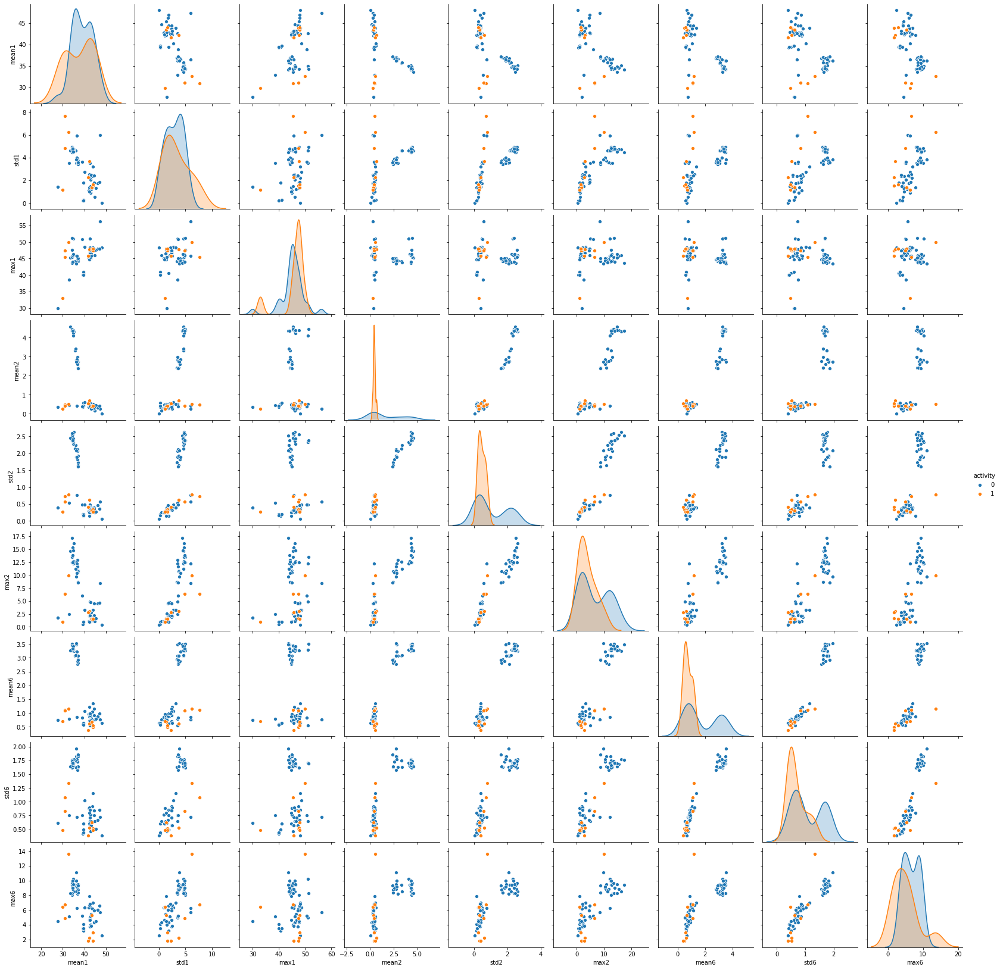

In [12]:
sns.pairplot(train_table, hue="activity")

## ii. Break each time series in your training set into two (approximately) equal length time series. Now instead of 6 time series for each of the training instances, you have 12 time series for each training instance. Repeat the experiment in 1(d)i, i.e depict scatter plots of the features extracted from both parts of the time series 1,2, and 12. Do you see any considerable difference in the results with those of 1(d)i?¶

In [13]:
train_split_set = []
keywords2 = ["time", "avg_rss12", "var_rss12", "avg_rss13", "var_rss13","vg_rss23", "ar_rss23", "timef","avg_rss12f", "var_rss12f", "avg_rss13f", "var_rss13f","vg_rss23f", "ar_rss23f"]  
keywords3 = ["avg_rss12", "var_rss12", "avg_rss13", "var_rss13","vg_rss23", "ar_rss23","avg_rss12f", "var_rss12f", "avg_rss13f", "var_rss13f","vg_rss23f", "ar_rss23f"]  
for i in range(len(trainset)):
    breaks = []
    breaks.append(trainset[i].iloc[0:240].reset_index(drop=True))
    breaks.append(trainset[i].iloc[240:480].reset_index(drop=True))
    pf = pd.concat(breaks, axis=1)
    pf.columns = keywords2
    train_split_set.append(pf)
    
train_2_table = Extraction(train_split_set, keywords3)[['mean1','std1','max1', 'mean2', 'std2', 'max2', 'mean12', 'std12','max12']]
activity1 = []
for r in range(len(train_split_set)):
    if r<9:
        activity1.append(1)
    else:
        activity1.append(0)
train_2_table['activity'] = activity1

train_2_table

,mean1,std1,max1,mean2,std2,max2,mean12,std12,max12,activity
0,44.057167,1.556971,46.50,0.381042,0.329540,1.50,0.388333,0.478528,1.50,1
1,43.278875,3.473355,47.75,0.673292,0.634285,3.00,0.586083,0.491873,2.18,1
2,41.621208,3.118644,45.75,0.623083,0.489595,2.83,0.347500,0.363144,1.50,1
3,44.117042,1.359836,48.00,0.250042,0.314099,1.30,0.543875,0.473445,4.06,1
4,43.486208,1.281976,45.00,0.378667,0.284434,1.30,0.585750,0.487918,2.96,1
...,...,...,...,...,...,...,...,...,...,...
64,33.334500,4.874433,45.00,4.408083,2.196206,11.78,3.290292,1.646023,8.32,0
65,34.036750,4.872880,44.50,4.778292,2.762730,13.47,3.321417,1.758379,9.67,0
66,34.033875,4.758757,43.33,4.574625,2.391804,12.47,3.432208,1.691050,8.64,0
67,34.920792,4.272282,44.00,4.177958,2.341763,14.82,3.418667,1.598536,9.51,0


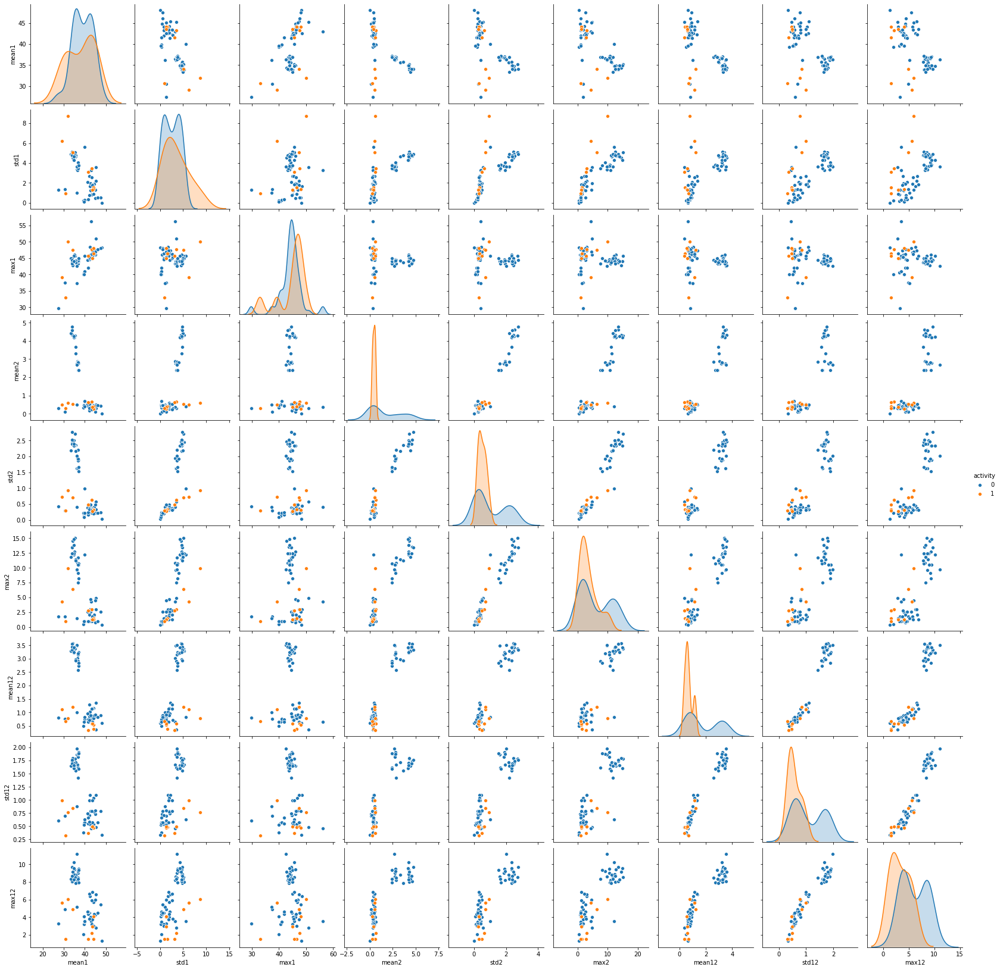

In [14]:
sns.pairplot(train_2_table, hue="activity")

### There is no significant difference between these two figures.

## iii. Break each time series in your training set into l ∈ {1,2,...,20} time series of approximately equal length and use logistic regression to solve the binary classification problem, using time-domain features.  

In [62]:
# get rid of unrelated column
trainset_temp = []
for i in range(len(trainset)):
    trainset_temp.append(trainset[i].drop(columns=['time'])) 


In [18]:
# Define break and combine function
def breakandcombine(ns):
    breakdown = []
    for i in range(len(trainset_temp)):
        breaks1 = []
        x = 0
        y = int(480/ns)
        for j in range(ns):
            temp = pd.DataFrame()
            temp = trainset_temp[i].iloc[x:y].reset_index(drop=True)
            temp.columns = ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
            breaks1.append(temp)
            x = y
            y = y + int(480/ns)
        
        pff = pd.concat(breaks1, axis=1)
        breakdown.append(pff)
    return breakdown    

In [19]:
# Get the final trainset
finaltrainsets = []
for ns in range(1, 21, 1):    
    finaltrainsets.append(breakandcombine(ns))  

In [20]:
finaltrainsets

[[     avg_rss121  var_rss121  avg_rss131  var_rss131  vg_rss231  ar_rss231
  0         42.00        0.71       21.25        0.43      30.00       0.00
  1         41.50        0.50       20.25        1.48      31.25       1.09
  2         41.50        0.50       14.25        1.92      33.00       0.00
  3         40.75        0.83       15.75        0.43      33.00       0.00
  4         40.00        0.71       20.00        2.74      32.75       0.43
  ..          ...         ...         ...         ...        ...        ...
  475       42.50        0.50       20.00        0.82      36.00       0.00
  476       42.67        0.47       21.00        0.00      36.33       0.47
  477       44.33        0.94       21.00        0.00      36.33       0.47
  478       45.25        0.43       26.75        1.79      36.00       0.00
  479       47.25        0.83       29.75        0.43      35.25       1.30
  
  [480 rows x 6 columns],
       avg_rss121  var_rss121  avg_rss131  var_rss131  vg_r

In [21]:
# Get all possible keywords
keywords_loop = []
for ns in range(1, 21, 1):
    keywords4 = []
    for j in range(ns):
        keywords4 = keywords4 + ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
    keywords_loop.append(keywords4)

## Calculate the p-values for your logistic regression parameters in each model corresponding to each value of l and refit a logistic regression model using your pruned set of features. 

In [56]:
# Create feature and label date
def Create_feature_label_train(data, keywords):
    breakdown_table = pd.DataFrame()
    breakdown_table1 = pd.DataFrame()

    breakdown_table = Extraction(data, keywords)
    activity2 = []
    for r in range(len(breakdown_table)):
        if r<9:
            activity2.append(1)
        else:
            activity2.append(0)
    breakdown_table['activity'] = activity2
    #print(breakdown_table)
    breakdown_table1 = breakdown_table[breakdown_table.columns.drop(list(breakdown_table.filter(regex='activity')))]
    
    return breakdown_table1, breakdown_table['activity']

def Create_feature_label_test(data, keywords):
    breakdown_table = pd.DataFrame()
    breakdown_table1 = pd.DataFrame()

    breakdown_table = Extraction(data, keywords)
    activity2 = []
    for r in range(len(breakdown_table)):
        if r<4:
            activity2.append(1)
        else:
            activity2.append(0)
    breakdown_table['activity'] = activity2
    #print(breakdown_table)
    breakdown_table1 = breakdown_table[breakdown_table.columns.drop(list(breakdown_table.filter(regex='activity')))]
    
    return breakdown_table1, breakdown_table['activity']

In [29]:
for q in range(0, 20, 1):
    X, y = Create_feature_label_train(finaltrainsets[q], keywords_loop[q])
    
    clf = LogisticRegression(penalty='none')
    clf.fit(X, y)
    
    coef = clf.coef_ 
    scores, pvalues = chi2(X, y)
    print("When l equals ", q+1, " :")
    for i, feature in enumerate(X):
        print("{}:     coef is    {}     and     p-value is    {}".format(feature, round(coef[0][i],2), round(pvalues[i],4)))



When l equals  1  :
min1:     coef is    -0.3     and     p-value is    0.9161
max1:     coef is    -0.14     and     p-value is    0.8283
mean1:     coef is    -0.58     and     p-value is    0.516
median1:     coef is    -0.14     and     p-value is    0.5456
std1:     coef is    -0.19     and     p-value is    0.4813
fq1:     coef is    -0.3     and     p-value is    0.4123
tq1:     coef is    -1.23     and     p-value is    0.3997
min2:     coef is    0.0     and     p-value is    nan
max2:     coef is    -0.52     and     p-value is    0.0012
mean2:     coef is    -0.19     and     p-value is    0.0057
median2:     coef is    -0.07     and     p-value is    0.0105
std2:     coef is    -0.14     and     p-value is    0.0916
fq2:     coef is    -0.08     and     p-value is    0.0129
tq2:     coef is    -0.33     and     p-value is    0.0013
min3:     coef is    -0.12     and     p-value is    0.8448
max3:     coef is    0.25     and     p-value is    0.0022
mean3:     coef is    -0.

When l equals  4  :
min1:     coef is    0.07     and     p-value is    0.9846
max1:     coef is    -0.06     and     p-value is    0.3683
mean1:     coef is    -0.09     and     p-value is    0.5305
median1:     coef is    -0.09     and     p-value is    0.5437
std1:     coef is    -0.01     and     p-value is    0.3891
fq1:     coef is    -0.12     and     p-value is    0.6104
tq1:     coef is    -0.07     and     p-value is    0.3956
min2:     coef is    -0.0     and     p-value is    0.7073
max2:     coef is    -0.26     and     p-value is    0.0002
mean2:     coef is    -0.04     and     p-value is    0.0062
median2:     coef is    -0.03     and     p-value is    0.009
std2:     coef is    -0.04     and     p-value is    0.0702
fq2:     coef is    -0.02     and     p-value is    0.026
tq2:     coef is    -0.05     and     p-value is    0.0009
min3:     coef is    -0.38     and     p-value is    0.7522
max3:     coef is    0.24     and     p-value is    0.0096
mean3:     coef is   

When l equals  5  :
min1:     coef is    -0.16     and     p-value is    0.9225
max1:     coef is    -0.02     and     p-value is    0.21
mean1:     coef is    -0.06     and     p-value is    0.5209
median1:     coef is    -0.05     and     p-value is    0.5599
std1:     coef is    0.03     and     p-value is    0.1664
fq1:     coef is    -0.06     and     p-value is    0.7807
tq1:     coef is    -0.05     and     p-value is    0.3482
min2:     coef is    -0.0     and     p-value is    0.6074
max2:     coef is    -0.06     and     p-value is    0.0
mean2:     coef is    -0.02     and     p-value is    0.0049
median2:     coef is    -0.01     and     p-value is    0.0082
std2:     coef is    -0.01     and     p-value is    0.0446
fq2:     coef is    -0.01     and     p-value is    0.0272
tq2:     coef is    -0.02     and     p-value is    0.0009
min3:     coef is    -0.29     and     p-value is    0.6504
max3:     coef is    0.1     and     p-value is    0.0384
mean3:     coef is    -0.

When l equals  6  :
min1:     coef is    -0.11     and     p-value is    0.9197
max1:     coef is    -0.02     and     p-value is    0.1574
mean1:     coef is    -0.03     and     p-value is    0.561
median1:     coef is    -0.02     and     p-value is    0.5803
std1:     coef is    0.01     and     p-value is    0.0922
fq1:     coef is    -0.02     and     p-value is    0.8831
tq1:     coef is    -0.03     and     p-value is    0.3483
min2:     coef is    -0.0     and     p-value is    0.4274
max2:     coef is    -0.05     and     p-value is    0.0
mean2:     coef is    -0.01     and     p-value is    0.0044
median2:     coef is    -0.01     and     p-value is    0.008
std2:     coef is    -0.01     and     p-value is    0.0393
fq2:     coef is    -0.01     and     p-value is    0.0154
tq2:     coef is    -0.02     and     p-value is    0.0009
min3:     coef is    -0.26     and     p-value is    0.2702
max3:     coef is    0.08     and     p-value is    0.0839
mean3:     coef is    -0

When l equals  7  :
min1:     coef is    -0.1     and     p-value is    0.9881
max1:     coef is    -0.02     and     p-value is    0.1671
mean1:     coef is    -0.03     and     p-value is    0.583
median1:     coef is    -0.02     and     p-value is    0.594
std1:     coef is    0.01     and     p-value is    0.0828
fq1:     coef is    -0.03     and     p-value is    0.9245
tq1:     coef is    -0.03     and     p-value is    0.3522
min2:     coef is    -0.0     and     p-value is    0.362
max2:     coef is    -0.03     and     p-value is    0.0
mean2:     coef is    -0.01     and     p-value is    0.0044
median2:     coef is    -0.0     and     p-value is    0.0076
std2:     coef is    -0.01     and     p-value is    0.0411
fq2:     coef is    -0.0     and     p-value is    0.0167
tq2:     coef is    -0.02     and     p-value is    0.0009
min3:     coef is    -0.23     and     p-value is    0.1248
max3:     coef is    0.06     and     p-value is    0.0889
mean3:     coef is    -0.01 

When l equals  8  :
min1:     coef is    -0.09     and     p-value is    0.9832
max1:     coef is    -0.01     and     p-value is    0.1683
mean1:     coef is    -0.02     and     p-value is    0.5782
median1:     coef is    -0.02     and     p-value is    0.5914
std1:     coef is    0.01     and     p-value is    0.1034
fq1:     coef is    -0.02     and     p-value is    0.9186
tq1:     coef is    -0.02     and     p-value is    0.3701
min2:     coef is    -0.0     and     p-value is    0.3272
max2:     coef is    -0.02     and     p-value is    0.0
mean2:     coef is    -0.01     and     p-value is    0.0043
median2:     coef is    -0.0     and     p-value is    0.0077
std2:     coef is    -0.01     and     p-value is    0.0455
fq2:     coef is    -0.0     and     p-value is    0.0162
tq2:     coef is    -0.02     and     p-value is    0.0009
min3:     coef is    -0.14     and     p-value is    0.9978
max3:     coef is    0.05     and     p-value is    0.0765
mean3:     coef is    -0

When l equals  9  :
min1:     coef is    -0.04     and     p-value is    0.9171
max1:     coef is    -0.03     and     p-value is    0.1712
mean1:     coef is    -0.03     and     p-value is    0.5793
median1:     coef is    -0.03     and     p-value is    0.6318
std1:     coef is    -0.0     and     p-value is    0.1298
fq1:     coef is    -0.02     and     p-value is    0.8603
tq1:     coef is    -0.04     and     p-value is    0.3838
min2:     coef is    -0.0     and     p-value is    0.3246
max2:     coef is    -0.05     and     p-value is    0.0
mean2:     coef is    -0.02     and     p-value is    0.005
median2:     coef is    -0.02     and     p-value is    0.0081
std2:     coef is    -0.01     and     p-value is    0.0483
fq2:     coef is    -0.01     and     p-value is    0.0174
tq2:     coef is    -0.03     and     p-value is    0.001
min3:     coef is    -0.12     and     p-value is    0.8734
max3:     coef is    0.07     and     p-value is    0.0809
mean3:     coef is    -0

When l equals  10  :
min1:     coef is    -0.01     and     p-value is    0.9219
max1:     coef is    -0.07     and     p-value is    0.1825
mean1:     coef is    -0.03     and     p-value is    0.5724
median1:     coef is    -0.03     and     p-value is    0.643
std1:     coef is    -0.02     and     p-value is    0.1493
fq1:     coef is    -0.02     and     p-value is    0.8317
tq1:     coef is    -0.05     and     p-value is    0.3878
min2:     coef is    -0.0     and     p-value is    0.2555
max2:     coef is    -0.08     and     p-value is    0.0
mean2:     coef is    -0.03     and     p-value is    0.0048
median2:     coef is    -0.03     and     p-value is    0.0073
std2:     coef is    -0.02     and     p-value is    0.0482
fq2:     coef is    -0.02     and     p-value is    0.0244
tq2:     coef is    -0.04     and     p-value is    0.0011
min3:     coef is    -0.12     and     p-value is    0.6823
max3:     coef is    -0.02     and     p-value is    0.1366
mean3:     coef is  

When l equals  11  :
min1:     coef is    -0.05     and     p-value is    0.8778
max1:     coef is    -0.01     and     p-value is    0.1986
mean1:     coef is    -0.02     and     p-value is    0.5769
median1:     coef is    -0.01     and     p-value is    0.6352
std1:     coef is    0.01     and     p-value is    0.1675
fq1:     coef is    -0.01     and     p-value is    0.8413
tq1:     coef is    -0.02     and     p-value is    0.387
min2:     coef is    -0.0     and     p-value is    0.2299
max2:     coef is    -0.03     and     p-value is    0.0
mean2:     coef is    -0.01     and     p-value is    0.0048
median2:     coef is    -0.01     and     p-value is    0.0067
std2:     coef is    -0.01     and     p-value is    0.0503
fq2:     coef is    -0.01     and     p-value is    0.0243
tq2:     coef is    -0.02     and     p-value is    0.0012
min3:     coef is    -0.1     and     p-value is    0.5373
max3:     coef is    -0.0     and     p-value is    0.1285
mean3:     coef is    -

When l equals  12  :
min1:     coef is    -0.06     and     p-value is    0.8469
max1:     coef is    0.0     and     p-value is    0.1992
mean1:     coef is    -0.01     and     p-value is    0.5681
median1:     coef is    -0.01     and     p-value is    0.6215
std1:     coef is    0.01     and     p-value is    0.1751
fq1:     coef is    -0.01     and     p-value is    0.821
tq1:     coef is    -0.01     and     p-value is    0.3907
min2:     coef is    -0.0     and     p-value is    0.2198
max2:     coef is    -0.01     and     p-value is    0.0
mean2:     coef is    -0.01     and     p-value is    0.0047
median2:     coef is    -0.01     and     p-value is    0.0069
std2:     coef is    -0.0     and     p-value is    0.0511
fq2:     coef is    -0.0     and     p-value is    0.0257
tq2:     coef is    -0.01     and     p-value is    0.0013
min3:     coef is    -0.07     and     p-value is    0.819
max3:     coef is    0.02     and     p-value is    0.1155
mean3:     coef is    0.0  

When l equals  13  :
min1:     coef is    -0.05     and     p-value is    0.8051
max1:     coef is    -0.01     and     p-value is    0.201
mean1:     coef is    -0.02     and     p-value is    0.5457
median1:     coef is    -0.01     and     p-value is    0.6363
std1:     coef is    0.01     and     p-value is    0.196
fq1:     coef is    -0.02     and     p-value is    0.7723
tq1:     coef is    -0.01     and     p-value is    0.4279
min2:     coef is    -0.0     and     p-value is    0.2198
max2:     coef is    -0.01     and     p-value is    0.0
mean2:     coef is    -0.01     and     p-value is    0.0048
median2:     coef is    -0.0     and     p-value is    0.0066
std2:     coef is    -0.0     and     p-value is    0.0586
fq2:     coef is    -0.0     and     p-value is    0.0228
tq2:     coef is    -0.01     and     p-value is    0.0013
min3:     coef is    -0.07     and     p-value is    0.9999
max3:     coef is    -0.0     and     p-value is    0.0937
mean3:     coef is    -0.0

When l equals  14  :
min1:     coef is    -0.06     and     p-value is    0.7449
max1:     coef is    -0.02     and     p-value is    0.201
mean1:     coef is    -0.03     and     p-value is    0.5387
median1:     coef is    -0.02     and     p-value is    0.6521
std1:     coef is    0.01     and     p-value is    0.2251
fq1:     coef is    -0.03     and     p-value is    0.766
tq1:     coef is    -0.02     and     p-value is    0.4297
min2:     coef is    -0.0     and     p-value is    0.2198
max2:     coef is    -0.01     and     p-value is    0.0
mean2:     coef is    -0.01     and     p-value is    0.0048
median2:     coef is    -0.0     and     p-value is    0.0053
std2:     coef is    -0.0     and     p-value is    0.0599
fq2:     coef is    -0.0     and     p-value is    0.0245
tq2:     coef is    -0.01     and     p-value is    0.0013
min3:     coef is    -0.04     and     p-value is    0.9441
max3:     coef is    0.01     and     p-value is    0.0821
mean3:     coef is    0.0 

When l equals  15  :
min1:     coef is    -0.04     and     p-value is    0.7038
max1:     coef is    -0.01     and     p-value is    0.2111
mean1:     coef is    -0.02     and     p-value is    0.5493
median1:     coef is    -0.01     and     p-value is    0.6648
std1:     coef is    0.01     and     p-value is    0.2821
fq1:     coef is    -0.02     and     p-value is    0.7434
tq1:     coef is    -0.01     and     p-value is    0.4295
min2:     coef is    -0.0     and     p-value is    0.2141
max2:     coef is    -0.02     and     p-value is    0.0
mean2:     coef is    -0.01     and     p-value is    0.005
median2:     coef is    -0.01     and     p-value is    0.0044
std2:     coef is    -0.0     and     p-value is    0.0644
fq2:     coef is    -0.0     and     p-value is    0.022
tq2:     coef is    -0.01     and     p-value is    0.0016
min3:     coef is    -0.05     and     p-value is    0.4796
max3:     coef is    0.01     and     p-value is    0.0808
mean3:     coef is    -0.

When l equals  16  :
min1:     coef is    -0.04     and     p-value is    0.6922
max1:     coef is    -0.01     and     p-value is    0.2699
mean1:     coef is    -0.01     and     p-value is    0.5753
median1:     coef is    -0.01     and     p-value is    0.6687
std1:     coef is    0.01     and     p-value is    0.3477
fq1:     coef is    -0.02     and     p-value is    0.7542
tq1:     coef is    -0.01     and     p-value is    0.4398
min2:     coef is    -0.0     and     p-value is    0.2018
max2:     coef is    -0.02     and     p-value is    0.0
mean2:     coef is    -0.01     and     p-value is    0.005
median2:     coef is    -0.01     and     p-value is    0.005
std2:     coef is    -0.0     and     p-value is    0.0675
fq2:     coef is    -0.0     and     p-value is    0.0173
tq2:     coef is    -0.01     and     p-value is    0.0014
min3:     coef is    -0.05     and     p-value is    0.549
max3:     coef is    -0.0     and     p-value is    0.0667
mean3:     coef is    -0.0

When l equals  17  :
min1:     coef is    -0.03     and     p-value is    0.6528
max1:     coef is    -0.0     and     p-value is    0.3267
mean1:     coef is    -0.01     and     p-value is    0.5936
median1:     coef is    -0.0     and     p-value is    0.6821
std1:     coef is    0.01     and     p-value is    0.3671
fq1:     coef is    -0.01     and     p-value is    0.7739
tq1:     coef is    -0.01     and     p-value is    0.4527
min2:     coef is    -0.0     and     p-value is    0.2018
max2:     coef is    -0.01     and     p-value is    0.0001
mean2:     coef is    -0.01     and     p-value is    0.0053
median2:     coef is    -0.01     and     p-value is    0.0061
std2:     coef is    -0.0     and     p-value is    0.0715
fq2:     coef is    -0.0     and     p-value is    0.0158
tq2:     coef is    -0.01     and     p-value is    0.0016
min3:     coef is    -0.04     and     p-value is    0.3759
max3:     coef is    -0.0     and     p-value is    0.0746
mean3:     coef is    

When l equals  18  :
min1:     coef is    -0.03     and     p-value is    0.6517
max1:     coef is    -0.0     and     p-value is    0.3264
mean1:     coef is    -0.01     and     p-value is    0.5876
median1:     coef is    -0.0     and     p-value is    0.7075
std1:     coef is    0.01     and     p-value is    0.3869
fq1:     coef is    -0.01     and     p-value is    0.7594
tq1:     coef is    -0.0     and     p-value is    0.457
min2:     coef is    -0.0     and     p-value is    0.1951
max2:     coef is    -0.02     and     p-value is    0.0001
mean2:     coef is    -0.01     and     p-value is    0.0056
median2:     coef is    -0.01     and     p-value is    0.0073
std2:     coef is    -0.0     and     p-value is    0.0726
fq2:     coef is    -0.0     and     p-value is    0.0185
tq2:     coef is    -0.01     and     p-value is    0.0023
min3:     coef is    -0.06     and     p-value is    0.426
max3:     coef is    -0.01     and     p-value is    0.0784
mean3:     coef is    -0

When l equals  19  :
min1:     coef is    -0.03     and     p-value is    0.6665
max1:     coef is    -0.01     and     p-value is    0.3281
mean1:     coef is    -0.01     and     p-value is    0.5845
median1:     coef is    -0.01     and     p-value is    0.6984
std1:     coef is    0.0     and     p-value is    0.3881
fq1:     coef is    -0.01     and     p-value is    0.7445
tq1:     coef is    -0.02     and     p-value is    0.4412
min2:     coef is    -0.0     and     p-value is    0.1951
max2:     coef is    -0.01     and     p-value is    0.0001
mean2:     coef is    -0.01     and     p-value is    0.0055
median2:     coef is    -0.01     and     p-value is    0.0065
std2:     coef is    -0.0     and     p-value is    0.074
fq2:     coef is    -0.0     and     p-value is    0.0175
tq2:     coef is    -0.01     and     p-value is    0.0016
min3:     coef is    -0.04     and     p-value is    0.5413
max3:     coef is    -0.0     and     p-value is    0.0784
mean3:     coef is    

When l equals  20  :
min1:     coef is    -0.03     and     p-value is    0.6571
max1:     coef is    -0.01     and     p-value is    0.3313
mean1:     coef is    -0.01     and     p-value is    0.5878
median1:     coef is    -0.01     and     p-value is    0.7006
std1:     coef is    0.0     and     p-value is    0.4029
fq1:     coef is    -0.01     and     p-value is    0.7472
tq1:     coef is    -0.01     and     p-value is    0.441
min2:     coef is    -0.0     and     p-value is    0.1951
max2:     coef is    -0.01     and     p-value is    0.0001
mean2:     coef is    -0.01     and     p-value is    0.0056
median2:     coef is    -0.01     and     p-value is    0.0061
std2:     coef is    -0.0     and     p-value is    0.0751
fq2:     coef is    -0.0     and     p-value is    0.0152
tq2:     coef is    -0.01     and     p-value is    0.0018
min3:     coef is    -0.03     and     p-value is    0.5413
max3:     coef is    -0.0     and     p-value is    0.0539
mean3:     coef is    

## Alternatively, you can use backward selection using sklearn.feature selection or glm in R. Use 5-fold cross-validation to determine the best value of the pair (l, p), where p is the number of features used in recursive feature elimination. 

In [30]:
for q in range(0, 20, 1):
    
    X = pd.DataFrame() 
    y = pd.DataFrame()
    X, y = Create_feature_label_train(finaltrainsets[q], keywords_loop[q])
    
    clf = LogisticRegression(penalty='none')
    rfecv = RFECV(clf, step=1, cv=5)
    rfecv = rfecv.fit(X, y)
    row,p = X.iloc[:,rfecv.get_support()].shape
    train_score = rfecv.score(X, y)
    F1_score = f1_score(y, rfecv.predict(X))
    print("current l: ", q+1,"  best p :", p, "  F1 train score :", F1_score, "  train score :", train_score)


current l:  1   best p : 4   F1 train score : 1.0   train score : 1.0
current l:  2   best p : 14   F1 train score : 1.0   train score : 1.0
current l:  3   best p : 6   F1 train score : 1.0   train score : 1.0
current l:  4   best p : 18   F1 train score : 1.0   train score : 1.0
current l:  5   best p : 20   F1 train score : 1.0   train score : 1.0
current l:  6   best p : 20   F1 train score : 1.0   train score : 1.0
current l:  7   best p : 57   F1 train score : 1.0   train score : 1.0
current l:  8   best p : 40   F1 train score : 1.0   train score : 1.0
current l:  9   best p : 31   F1 train score : 1.0   train score : 1.0
current l:  10   best p : 20   F1 train score : 1.0   train score : 1.0
current l:  11   best p : 2   F1 train score : 0.9473684210526316   train score : 0.9855072463768116
current l:  12   best p : 4   F1 train score : 1.0   train score : 1.0
current l:  13   best p : 2   F1 train score : 0.8888888888888888   train score : 0.9710144927536232
current l:  14   b

In [44]:
def best_model_feature_label(ns, data):
    breakdown = []
    for i in range(len(data)):
        breaks1 = []
        x = 0
        y = int(480/ns)
        m = 480%ns
        keywords4 = []
        for j in range(ns):
            temp = pd.DataFrame()
            temp = trainset_temp[i].iloc[x:y].reset_index(drop=True)
            temp.columns = ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
            keywords4 = keywords4 + ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
            breaks1.append(temp)
            x = y
            y = y + int(480/ns)

        pff = pd.concat(breaks1, axis=1)
        breakdown.append(pff)
    return breakdown, keywords4


 The best choice is l = 3 and p = 6

In [75]:

bkd, kw4 = best_model_feature_label(3, trainset_temp)

X = pd.DataFrame() 
y = pd.DataFrame()
    
X, y = Create_feature_label_train(bkd, kw4)

clf = LogisticRegression(penalty='none')
rfecv = RFECV(clf, step=1, cv=5)
rfecv = rfecv.fit(X, y)
row,p = X.iloc[:,rfecv.get_support()].shape
train_score = rfecv.score(X, y)
F1_score = f1_score(y, rfecv.predict(X))
print('The best choice is l = 3 and p = 6 :')
print("current l: ", ns,"  best p :", p, "  F1 train score :", F1_score, "  train score :", train_score)


The best choice is l = 3 and p = 6 :
current l:  3   best p : 6   F1 train score : 1.0   train score : 1.0


## Explain what the right way and the wrong way are to perform cross-validation in this problem. Obviously, use the right way! 

#### Step 1: Find some "best" predictors that are highly correlated with the label.
#### Step 2: Apply a classifier, using only these selected predictors

#### Right way: Apply cross-validation only in step 1 and step 2. (Do cross-validation before selecting features.)
#### Wrong way: Apply cross-validation only in step 2. (Do cross-validation after selecting features)

## iv. Report the confusion matrix and show the ROC and AUC 

In [76]:
# pruned features
reduced_trainset = X.iloc[:,rfecv.support_]
reduced_trainset

,max2,min5,max5,tq5,tq7,max18
0,1.50,30.00,38.50,37.0000,45.2500,1.50
1,3.00,32.00,38.67,37.2700,45.0000,2.18
2,2.18,23.67,35.25,30.0000,43.6700,1.00
3,1.30,15.00,33.50,25.0000,43.5000,4.06
4,1.12,11.33,30.75,28.1250,45.0000,2.96
...,...,...,...,...,...,...
64,11.78,8.00,25.00,18.0000,36.8125,6.83
65,13.47,6.25,22.75,17.5625,38.0000,9.67
66,12.07,7.00,22.33,18.5000,38.0000,8.64
67,14.82,7.25,23.50,17.5000,38.2500,7.31


In [77]:
# Confusion matrix
clf = LogisticRegression(penalty='none')
clf.fit(reduced_trainset, y)

pred_prob = clf.predict_proba(reduced_trainset)[:,1]
pred_label = clf.predict(reduced_trainset) 

fpr, tpr, thresholds = roc_curve(y, pred_prob)

cm = confusion_matrix(y, pred_label)
cm = pd.DataFrame(cm,index=['Real False', 'Actual True'],columns=['Predicted False', 'Predicted True'])
cm

,Predicted False,Predicted True
Real False,60,0
Actual True,0,9


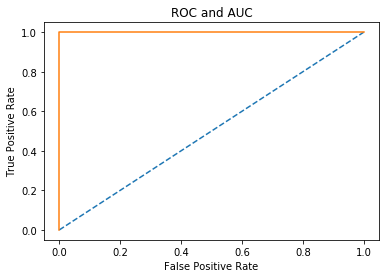

In [78]:
# ROC and AUC
plt.plot([0, 1], [0, 1], '--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC and AUC')
plt.show()

In [83]:
roc_auc_ = roc_auc_score(y, pred_prob)
print("ROC and AUC score is:", roc_auc_)

ROC and AUC score is: 1.0


## Report the parameters of your logistic regression

In [60]:
coef = clf.coef_ 
scores, pvalues = chi2(X, y)
for i, feature in enumerate(reduced_trainset):
    print("{}: coef is {} and p-value is {}".format(feature, round(coef[0][i],2), round(pvalues[i],4)))


max2: coef is -1.19 and p-value is 0.873
min5: coef is 1.49 and p-value is 0.777
max5: coef is 1.94 and p-value is 0.6371
tq5: coef is 1.6 and p-value is 0.5785
tq7: coef is -2.23 and p-value is 0.2949
max18: coef is -1.7 and p-value is 0.3699


## v. Test the classiﬁer on the test set

In [133]:
testset_temp = []
for i in range(len(testset)):
    testset_temp.append(testset[i].drop(columns=['time'])) 

In [70]:
ns = 3
breakdown = []
for i in range(len(testset_temp)):
    breaks1 = []
    x = 0
    y = int(480/ns)
    m = 480%ns
    keywords4 = []
    for j in range(ns):
        temp = pd.DataFrame()
        temp = testset_temp[i].iloc[x:y].reset_index(drop=True)
        temp.columns = ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        keywords4 = keywords4 + ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        breaks1.append(temp)
        x = y
        y = y + int(480/ns)
    
    pff = pd.concat(breaks1, axis=1)
    breakdown.append(pff)       

breakdown_table_ = Extraction(breakdown, keywords4)
activity2 = []
for r in range(len(breakdown_table_)):
    if r<4:
        activity2.append(1)
    else:
        activity2.append(0)
breakdown_table_['activity'] = activity2

breakdown_table2 = breakdown_table_[breakdown_table_.columns.drop(list(breakdown_table_.filter(regex='activity')))]

reduced_testset = breakdown_table2.iloc[:,rfecv.support_]
reduced_testset

,max2,min5,max5,tq5,tq7,max18
0,1.22,32.50,36.00,35.0000,40.50,1.87
1,0.94,30.00,36.00,34.5000,42.00,2.62
2,6.76,15.20,28.33,27.0000,27.75,4.97
3,0.94,12.50,22.50,18.7500,30.00,6.76
4,8.18,7.00,24.67,21.5000,40.75,9.34
5,8.95,11.33,23.75,21.0000,40.00,8.83
6,12.99,10.00,24.25,21.7500,40.25,8.50
7,1.48,4.75,12.50,10.0625,27.00,3.30
8,3.11,1.00,12.75,10.5000,48.00,1.50
9,0.00,1.00,10.25,5.0000,48.00,1.30


## Compare the accuracy on the test set with the cross-validation accuracy you obtained previously.

In [72]:
test_score = clf.score(reduced_testset, breakdown_table_['activity'])
print("Accuracy of the test data is: ", round(test_score, 3))
print("Cross-validation accuracy of train data is: 1.0")

Accuracy of the test data is:  1.0
Cross-validation accuracy of train data is: 1.0


## vi. Do your classes seem to be well-separated to cause instability in calculating logistic regression parameters?

Yes! From the pairplot of all features, we can find that easily.

And there is indeed instability in calculating logistic regression parameters, but LogisticRegression model has maximum iteration restriction. 


## vii. From the confusion matrices you obtained, do you see imbalanced classes? If yes, build a logistic regression model based on case-control sampling and adjust its parameters. Report the confusion matrix, ROC, and AUC of the model.

 YES

In [85]:
ns = 3
breakdown = []
for i in range(len(trainset_temp)):
    breaks1 = []
    x = 0
    y = int(480/ns)
    m = 480%ns
    keywords4 = []
    for j in range(ns):
        temp = pd.DataFrame()
        temp = trainset_temp[i].iloc[x:y].reset_index(drop=True)
        temp.columns = ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        keywords4 = keywords4 + ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        breaks1.append(temp)
        x = y
        y = y + int(480/ns)
    
    pff = pd.concat(breaks1, axis=1)
    breakdown.append(pff)       

breakdown_table = Extraction(breakdown, keywords4)
activity2 = []
for r in range(len(breakdown_table)):
    if r<9:
        activity2.append(1)
    else:
        activity2.append(0)
breakdown_table['activity'] = activity2
#print(breakdown_table)
breakdown_table1 = breakdown_table[breakdown_table.columns.drop(list(breakdown_table.filter(regex='activity')))]
    
train_x = breakdown_table1
train_y = breakdown_table['activity']
sm = SMOTE()
x, y = sm.fit_resample(train_x, train_y)
train_x = pd.DataFrame(x)
train_y = pd.DataFrame(y)
clf = LogisticRegression(penalty='none')
rfecv = RFECV(clf, step=1, cv=5)
rfecv = rfecv.fit(train_x, train_y)
row,p = train_x.iloc[:,rfecv.get_support()].shape
train_score = rfecv.score(train_x, train_y)
F1_score = f1_score(train_y, rfecv.predict(train_x))
print("current l: ", ns,"  best p :", p, "  F1 train score :", F1_score, "  train score :", train_score)


current l:  3   best p : 4   F1 train score : 1.0   train score : 1.0


In [88]:
reduced_trainset = train_x.iloc[:,rfecv.support_]
reduced_trainset

,min5,tq5,tq7,max18
0,30.000000,37.000000,45.250000,1.500000
1,32.000000,37.270000,45.000000,2.180000
2,23.670000,30.000000,43.670000,1.000000
3,15.000000,25.000000,43.500000,4.060000
4,11.330000,28.125000,45.000000,2.960000
...,...,...,...,...
115,12.270951,21.271437,34.289459,2.299763
116,13.697153,25.759994,43.174288,4.155542
117,7.807987,28.186308,38.657840,3.611128
118,23.229348,33.781492,45.159338,2.029467


In [89]:
clf = LogisticRegression(penalty='none')
clf.fit(reduced_trainset, train_y)

pred_prob = clf.predict_proba(reduced_trainset)[:,1]
pred_label = clf.predict(reduced_trainset) 

fpr, tpr, thresholds = roc_curve(train_y, pred_prob)

cm = confusion_matrix(train_y, pred_label)
cm = pd.DataFrame(cm,index=['Actual False', 'Actual True'],columns=['Predicted False', 'Predicted True'])
cm

,Predicted False,Predicted True
Actual False,60,0
Actual True,0,60


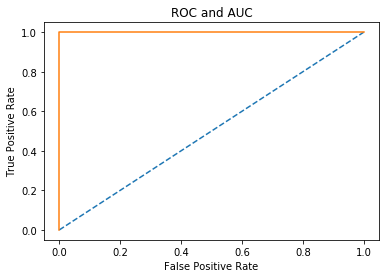

In [90]:
# ROC and AUC
plt.plot([0, 1], [0, 1], '--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC and AUC')
plt.show()

In [91]:
roc_auc_ = roc_auc_score(y, pred_prob)
print("ROC and AUC score is:", roc_auc_)

ROC and AUC score is: 1.0


# (e) Binary Classiﬁcation Using L1-penalized logistic regression

## i. Repeat 1(d)iii using L1-penalized logistic regression

In [97]:
for q in range(0, 20, 1):
    
    X = pd.DataFrame() 
    y = pd.DataFrame()
    X, y = Create_feature_label_train(finaltrainsets[q], keywords_loop[q])
    
    clf = LogisticRegressionCV(cv=5, penalty='l1', solver='liblinear')
    rfecv = RFE(clf, step=1)
    rfecv = rfecv.fit(X, y)
    row,p = X.iloc[:,rfecv.get_support()].shape
    train_score = rfecv.score(X, y)
    F1_score = f1_score(y, rfecv.predict(X))
    print("current l: ", q+1, "  F1 train score :", F1_score, "  train score :", train_score)


current l:  1   F1 train score : 1.0   train score : 1.0
current l:  2   F1 train score : 1.0   train score : 1.0
current l:  3   F1 train score : 1.0   train score : 1.0
current l:  4   F1 train score : 1.0   train score : 1.0
current l:  5   F1 train score : 1.0   train score : 1.0
current l:  6   F1 train score : 1.0   train score : 1.0
current l:  7   F1 train score : 1.0   train score : 1.0
current l:  8   F1 train score : 1.0   train score : 1.0
current l:  9   F1 train score : 1.0   train score : 1.0
current l:  10   F1 train score : 1.0   train score : 1.0
current l:  11   F1 train score : 1.0   train score : 1.0
current l:  12   F1 train score : 1.0   train score : 1.0
current l:  13   F1 train score : 1.0   train score : 1.0
current l:  14   F1 train score : 1.0   train score : 1.0
current l:  15   F1 train score : 1.0   train score : 1.0
current l:  16   F1 train score : 1.0   train score : 1.0
current l:  17   F1 train score : 1.0   train score : 1.0
current l:  18   F1 tra

In [108]:
X = pd.DataFrame() 
y = pd.DataFrame()
X, y = Create_feature_label_train(finaltrainsets[2], keywords_loop[2])
    
clf = LogisticRegressionCV(cv=5, penalty='l1', solver='liblinear')
rfecv = RFE(clf, step=1)
rfecv = rfecv.fit(X, y)
row,p = X.iloc[:,rfecv.get_support()].shape
train_score = rfecv.score(X, y)
F1_score = f1_score(y, rfecv.predict(X))
print("current l: ", 3, "  F1 train score :", F1_score, "  train score :", train_score)

reduced_trainset1 = X.iloc[:,rfecv.support_]
clff = LogisticRegressionCV(cv=5, penalty='l1', solver='liblinear').fit(reduced_trainset1, y)

current l:  3   F1 train score : 1.0   train score : 1.0


In [109]:
ns = 3
breakdown = []
for i in range(len(testset_temp)):
    breaks1 = []
    x = 0
    y = int(480/ns)
    m = 480%ns
    keywords4 = []
    for j in range(ns):
        temp = pd.DataFrame()
        temp = testset_temp[i].iloc[x:y].reset_index(drop=True)
        temp.columns = ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        keywords4 = keywords4 + ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        breaks1.append(temp)
        x = y
        y = y + int(480/ns)
    
    pff = pd.concat(breaks1, axis=1)
    breakdown.append(pff)       

breakdown_table_ = Extraction(breakdown, keywords4)
activity2 = []
for r in range(len(breakdown_table_)):
    if r<4:
        activity2.append(1)
    else:
        activity2.append(0)
breakdown_table_['activity'] = activity2

breakdown_table2 = breakdown_table_[breakdown_table_.columns.drop(list(breakdown_table_.filter(regex='activity')))]

reduced_testset = breakdown_table2.iloc[:,rfecv.support_]

test_score = clff.score(reduced_testset, breakdown_table_['activity'])
print("Accuracy of the test data is: ", round(test_score, 3))
print("Cross-validation accuracy of train data is: 1.0")

Accuracy of the test data is:  1.0
Cross-validation accuracy of train data is: 1.0


## ii. Compare the L1-penalized with variable selection using p-values

According to the analysis, L1 penalized performs better is easier to implement.

# (f) Multi-class Classification (The Realistic Case)

## i. Find the best l in the same way as you found it in 1(e)i to build an L1- penalized multinomial regression model to classify all activities in your training set. Report your test error. Research how confusion matrices and ROC curves are defined for multiclass classification and show them for this problem if possible

In [110]:
def Addlabel_multi(data):
    addactivity = []
    for r in range(len(data)):
        if r<9:
            addactivity.append('bending')
        if 8<r<21:
            addactivity.append('cycling')
        if 20<r<33:
            addactivity.append('lying')
        if 32<r<45:
            addactivity.append('sitting')
        if 44<r<57:
            addactivity.append('standing')
        if 56<r<69:
            addactivity.append('walking')
    return addactivity

In [140]:
def Addlabel_multi_test(data):
    addactivity = []
    for r in range(len(data)):
        if r<4:
            addactivity.append('bending')
        if 3<r<7:
            addactivity.append('cycling')
        if 6<r<10:
            addactivity.append('lying')
        if 9<r<13:
            addactivity.append('sitting')
        if 12<r<16:
            addactivity.append('standing')
        if 15<r<19:
            addactivity.append('walking')
    return addactivity

In [154]:
T_score = []
for q in range(0, 20, 1):
	breakdown_table = pd.DataFrame()
	breakdown_table1 = pd.DataFrame()

	breakdown_table = Extraction(finaltrainsets[q], keywords_loop[q])
    
	breakdown_table['activity'] = Addlabel_multi(breakdown_table)
	#print(breakdown_table)
	breakdown_table1 = breakdown_table[breakdown_table.columns.drop(list(breakdown_table.filter(regex='activity')))]
    
    
	train_x = breakdown_table1
	train_y = breakdown_table['activity']
    
	clf = LogisticRegressionCV(cv=5, penalty='l1',solver='saga', multi_class='multinomial').fit(train_x, train_y)
    
	one_score = f1_score(train_y, clf.predict(train_x), average="macro")
    
	clf_score = clf.score(train_x,train_y)
    
	train_score = f1_score(train_y, clf.predict(train_x), average="macro")
    
	T_score.append(train_score)    
	if train_score >= np.max(T_score):
		print("Best l: ", q+1,"  train score :", train_score, "  clf score :", clf_score)
		break


Best l:  1   train score : 1.0   clf score : 1.0


In [162]:
breakdown_table = pd.DataFrame()
breakdown_table1 = pd.DataFrame()

breakdown_table = Extraction(finaltrainsets[0], keywords_loop[0])
    
breakdown_table['activity'] = Addlabel_multi(breakdown_table)
#print(breakdown_table)
breakdown_table1 = breakdown_table[breakdown_table.columns.drop(list(breakdown_table.filter(regex='activity')))]
       
X = breakdown_table1
y = breakdown_table['activity']
    
clf = LogisticRegressionCV(cv=5, penalty='l1',solver='saga', multi_class='multinomial')
rfecv = RFE(clf, step=1)
rfecv = rfecv.fit(X, y)
row,p = X.iloc[:,rfecv.get_support()].shape
train_score = rfecv.score(X, y)
F1_score = f1_score(y, rfecv.predict(X), average="macro")
print("current l: ", 1, "  F1 train score :", F1_score, "  train score :", train_score)

reduced_trainset1 = X.iloc[:,rfecv.support_]
clff = LogisticRegressionCV(cv=5, penalty='l1', solver='liblinear').fit(reduced_trainset1, y)

current l:  1   F1 train score : 0.972027972027972   train score : 0.9710144927536232


In [164]:
ns = 1
breakdown = []
for i in range(len(testset_temp)):
    breaks1 = []
    x = 0
    y = int(480/ns)
    m = 480%ns
    keywords4 = []
    for j in range(ns):
        temp = pd.DataFrame()
        temp = testset_temp[i].iloc[x:y].reset_index(drop=True)
        temp.columns = ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        keywords4 = keywords4 + ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        breaks1.append(temp)
        x = y
        y = y + int(480/ns)
    
    pff = pd.concat(breaks1, axis=1)
    breakdown.append(pff)       

breakdown_table_ = Extraction(breakdown, keywords4)

breakdown_table_['activity'] = Addlabel_multi_test(breakdown_table_ )

breakdown_table2 = breakdown_table_[breakdown_table_.columns.drop(list(breakdown_table_.filter(regex='activity')))]

reduced_testset = breakdown_table2.iloc[:,rfecv.support_]

test_score = clff.score(reduced_testset, breakdown_table_['activity'])
print("Accuracy of the test data is: ", round(test_score, 3))
print("test error: ", 1-round(test_score, 3))

Accuracy of the test data is:  0.842
test error:  0.15800000000000003


In [166]:
cm = confusion_matrix(breakdown_table_['activity'], clff.predict(reduced_testset))
cm = pd.DataFrame(cm,index=['Actual bending', 'Actual cycling', 'Actual lying', 'Actual sitting', 'Actual standing', 'Actual walking'],
                 columns = ['Predicted bending', 'Predicted cycling', 'Predicted lying', 'Predicted sitting', 'Predicted standing', 'Predited walking'])
cm

,Predicted bending,Predicted cycling,Predicted lying,Predicted sitting,Predicted standing,Predited walking
Actual bending,4,0,0,0,0,0
Actual cycling,0,2,0,0,0,1
Actual lying,0,0,3,0,0,0
Actual sitting,0,0,0,2,1,0
Actual standing,0,0,1,0,2,0
Actual walking,0,0,0,0,0,3


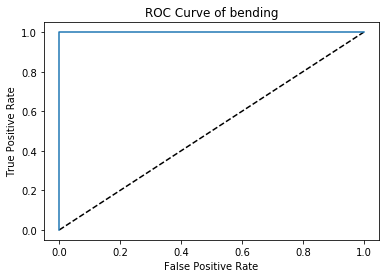

ROC and AUC score is: 1.0


In [260]:
y_score = clff.predict_proba(reduced_testset)
prob_bending=y_score[:, 0]
prob_cycling=y_score[:, 1]
prob_lying=y_score[:, 2]
prob_sitting=y_score[:, 3]
prob_standing=y_score[:, 4]
prob_walking=y_score[:, 5]

bending_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="bending" else 0)
fpr, tpr, thresholds = roc_curve(bending_test_y, prob_bending)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of bending')
plt.show()

roc_auc_ = roc_auc_score(bending_test_y, prob_bending)
print("ROC and AUC score is:", roc_auc_)

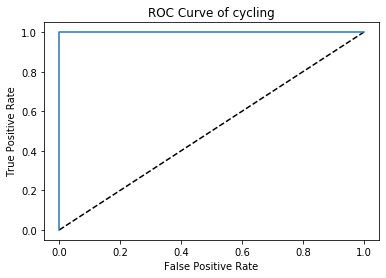

ROC and AUC score is: 1.0


In [259]:
cycling_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="cycling" else 0)
fpr, tpr, thresholds = roc_curve(cycling_test_y, prob_cycling)
#plot of cycling's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of cycling')
plt.show()

roc_auc_ = roc_auc_score(cycling_test_y, prob_cycling)
print("ROC and AUC score is:", roc_auc_)

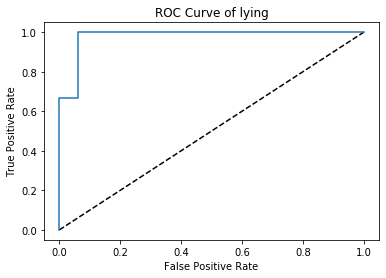

ROC and AUC score is: 0.9791666666666666


In [258]:
lying_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="lying" else 0)
fpr, tpr, thresholds = roc_curve(lying_test_y, prob_lying)
#plot of lying's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of lying')
plt.show()

roc_auc_ = roc_auc_score(lying_test_y, prob_lying)
print("ROC and AUC score is:", roc_auc_)

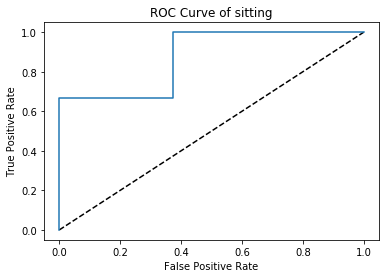

ROC and AUC score is: 0.875


In [257]:
#ROC curve of sitting
sitting_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="sitting" else 0)
fpr, tpr, thresholds = roc_curve(sitting_test_y, prob_sitting)
#plot of sitting's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of sitting')
plt.show()

roc_auc_ = roc_auc_score(sitting_test_y, prob_sitting)
print("ROC and AUC score is:", roc_auc_)

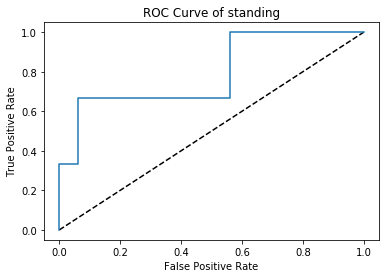

ROC and AUC score is: 0.7916666666666666


In [256]:
#ROC curve of standing
standing_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="standing" else 0)
fpr, tpr, thresholds = roc_curve(standing_test_y, prob_standing)
#plot of standing's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of standing')
plt.show()

roc_auc_ = roc_auc_score(standing_test_y, prob_standing)
print("ROC and AUC score is:", roc_auc_)

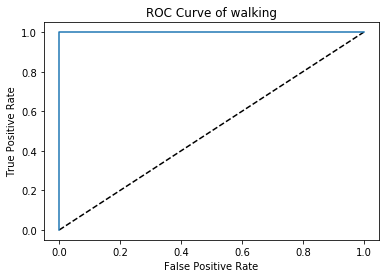

ROC and AUC score is: 1.0


In [261]:

#ROC curve of walking
walking_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="walking" else 0)
fpr, tpr, thresholds = roc_curve(walking_test_y, prob_walking)
#plot of walking's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of walking')
plt.show()

roc_auc_ = roc_auc_score(walking_test_y, prob_walking)
print("ROC and AUC score is:", roc_auc_)

## ii. Repeat 1(f)i using a Na¨ıve Bayes’ classifier. Use both Gaussian and Multinomial priors and compare the results.

In [292]:
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB

## Gaussian

In [289]:
T_score = []
for q in range(0, 20, 1):
	breakdown_table = pd.DataFrame()
	breakdown_table1 = pd.DataFrame()

	breakdown_table = Extraction(finaltrainsets[q], keywords_loop[q])
    
	breakdown_table['activity'] = Addlabel_multi(breakdown_table)
	#print(breakdown_table)
	breakdown_table1 = breakdown_table[breakdown_table.columns.drop(list(breakdown_table.filter(regex='activity')))]
        
	train_x = breakdown_table1
	train_y = breakdown_table['activity']
    
	GNB = GaussianNB().fit(train_x, train_y)
	train_score = f1_score(train_y, GNB.predict(train_x),average="macro")
	GNB_score = GNB.score(train_x,train_y)
    
    
	T_score.append(train_score)    

	print("Best l: ", q+1,"  train score :", train_score, "  GNB score :", GNB_score)



Best l:  1   train score : 0.9835294117647059   GNB score : 0.9855072463768116
Best l:  2   train score : 0.9835294117647059   GNB score : 0.9855072463768116
Best l:  3   train score : 0.969616368286445   GNB score : 0.9710144927536232
Best l:  4   train score : 0.9835294117647059   GNB score : 0.9855072463768116
Best l:  5   train score : 0.969616368286445   GNB score : 0.9710144927536232
Best l:  6   train score : 0.955557383792678   GNB score : 0.9565217391304348
Best l:  7   train score : 0.9835294117647059   GNB score : 0.9855072463768116
Best l:  8   train score : 0.9720279720279721   GNB score : 0.9710144927536232
Best l:  9   train score : 1.0   GNB score : 1.0
Best l:  10   train score : 0.9835294117647059   GNB score : 0.9855072463768116
Best l:  11   train score : 0.986086956521739   GNB score : 0.9855072463768116
Best l:  12   train score : 1.0   GNB score : 1.0
Best l:  13   train score : 1.0   GNB score : 1.0
Best l:  14   train score : 1.0   GNB score : 1.0
Best l:  15  

In [314]:
breakdown_table = pd.DataFrame()
breakdown_table1 = pd.DataFrame()

breakdown_table = Extraction(finaltrainsets[7], keywords_loop[7])
    
breakdown_table['activity'] = Addlabel_multi(breakdown_table)
#print(breakdown_table)
breakdown_table1 = breakdown_table[breakdown_table.columns.drop(list(breakdown_table.filter(regex='activity')))]
       
X = breakdown_table1
y = breakdown_table['activity']

params = {}

GNB = GaussianNB()

rfec = GridSearchCV(GNB, cv=StratifiedKFold(5), param_grid=params)
rfec.fit(X, y)
#row,p = X.iloc[:,rfec.get_support()].shape
train_score = rfec.score(X, y)
F1_score = f1_score(y, rfec.predict(X), average="macro")
print("current l: ", 1, "  F1 train score :", F1_score, "  train score :", train_score)

GNB = GaussianNB().fit(X, y)

current l:  1   F1 train score : 0.9720279720279721   train score : 0.9710144927536232


In [315]:
ns = 8
breakdown = []
for i in range(len(testset_temp)):
    breaks1 = []
    x = 0
    y = int(480/ns)
    m = 480%ns
    keywords4 = []
    for j in range(ns):
        temp = pd.DataFrame()
        temp = testset_temp[i].iloc[x:y].reset_index(drop=True)
        temp.columns = ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        keywords4 = keywords4 + ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        breaks1.append(temp)
        x = y
        y = y + int(480/ns)
    
    pff = pd.concat(breaks1, axis=1)
    breakdown.append(pff)       

breakdown_table_ = Extraction(breakdown, keywords4)

breakdown_table_['activity'] = Addlabel_multi_test(breakdown_table_ )

breakdown_table2 = breakdown_table_[breakdown_table_.columns.drop(list(breakdown_table_.filter(regex='activity')))]

#reduced_testset = breakdown_table2.iloc[:,rfecv.support_]

test_score = GNB.score(breakdown_table2, breakdown_table_['activity'])

#test_score = MNB.score(reduced_testset, breakdown_table_['activity'])
print("Accuracy of the test data is: ", round(test_score, 3))
print("test error: ", 1-round(test_score, 3))

Accuracy of the test data is:  0.789
test error:  0.21099999999999997


In [316]:
cm = confusion_matrix(breakdown_table_['activity'], GNB.predict(breakdown_table2))
cm = pd.DataFrame(cm,index=['Actual bending', 'Actual cycling', 'Actual lying', 'Actual sitting', 'Actual standing', 'Actual walking'],
                 columns = ['Predicted bending', 'Predicted cycling', 'Predicted lying', 'Predicted sitting', 'Predicted standing', 'Predited walking'])
cm

,Predicted bending,Predicted cycling,Predicted lying,Predicted sitting,Predicted standing,Predited walking
Actual bending,3,0,1,0,0,0
Actual cycling,0,3,0,0,0,0
Actual lying,1,0,2,0,0,0
Actual sitting,0,0,0,2,1,0
Actual standing,0,0,0,1,2,0
Actual walking,0,0,0,0,0,3


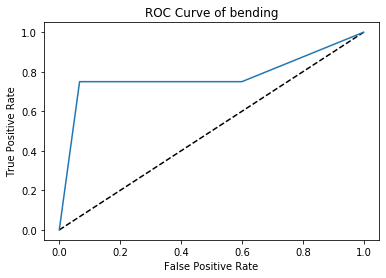

ROC and AUC score is: 0.7750000000000001


In [317]:
y_score = GNB.predict_proba(breakdown_table2)
prob_bending=y_score[:, 0]
prob_cycling=y_score[:, 1]
prob_lying=y_score[:, 2]
prob_sitting=y_score[:, 3]
prob_standing=y_score[:, 4]
prob_walking=y_score[:, 5]

bending_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="bending" else 0)
fpr, tpr, thresholds = roc_curve(bending_test_y, prob_bending)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of bending')
plt.show()

roc_auc_ = roc_auc_score(bending_test_y, prob_bending)
print("ROC and AUC score is:", roc_auc_)

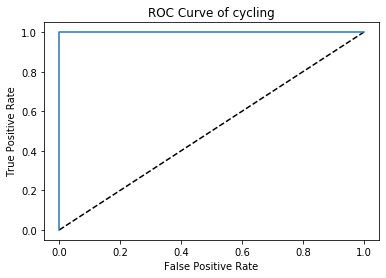

ROC and AUC score is: 1.0


In [318]:
cycling_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="cycling" else 0)
fpr, tpr, thresholds = roc_curve(cycling_test_y, prob_cycling)
#plot of cycling's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of cycling')
plt.show()

roc_auc_ = roc_auc_score(cycling_test_y, prob_cycling)
print("ROC and AUC score is:", roc_auc_)

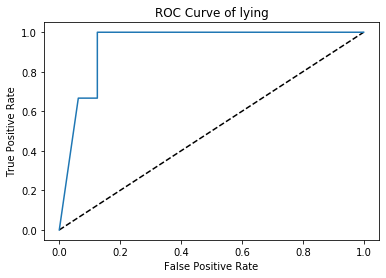

ROC and AUC score is: 0.9375


In [319]:
lying_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="lying" else 0)
fpr, tpr, thresholds = roc_curve(lying_test_y, prob_lying)
#plot of lying's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of lying')
plt.show()

roc_auc_ = roc_auc_score(lying_test_y, prob_lying)
print("ROC and AUC score is:", roc_auc_)

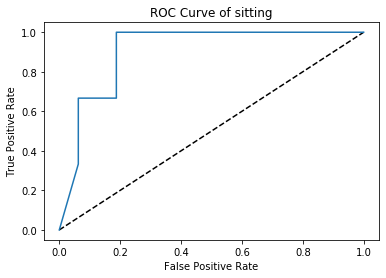

ROC and AUC score is: 0.90625


In [320]:
#ROC curve of sitting
sitting_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="sitting" else 0)
fpr, tpr, thresholds = roc_curve(sitting_test_y, prob_sitting)
#plot of sitting's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of sitting')
plt.show()

roc_auc_ = roc_auc_score(sitting_test_y, prob_sitting)
print("ROC and AUC score is:", roc_auc_)

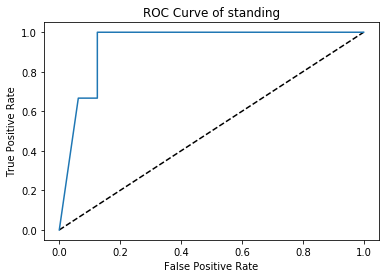

ROC and AUC score is: 0.9375


In [321]:
#ROC curve of standing
standing_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="standing" else 0)
fpr, tpr, thresholds = roc_curve(standing_test_y, prob_standing)
#plot of standing's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of standing')
plt.show()

roc_auc_ = roc_auc_score(standing_test_y, prob_standing)
print("ROC and AUC score is:", roc_auc_)

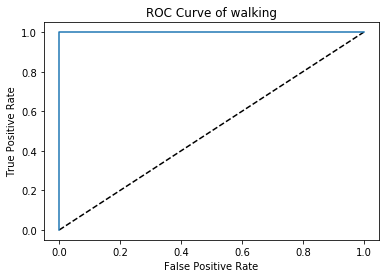

ROC and AUC score is: 1.0


In [322]:
#ROC curve of walking
walking_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="walking" else 0)
fpr, tpr, thresholds = roc_curve(walking_test_y, prob_walking)
#plot of walking's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of walking')
plt.show()

roc_auc_ = roc_auc_score(walking_test_y, prob_walking)
print("ROC and AUC score is:", roc_auc_)

## Multinomial:

In [263]:
T_score = []
for q in range(0, 20, 1):
	breakdown_table = pd.DataFrame()
	breakdown_table1 = pd.DataFrame()

	breakdown_table = Extraction(finaltrainsets[q], keywords_loop[q])
    
	breakdown_table['activity'] = Addlabel_multi(breakdown_table)
	#print(breakdown_table)
	breakdown_table1 = breakdown_table[breakdown_table.columns.drop(list(breakdown_table.filter(regex='activity')))]
        
	train_x = breakdown_table1
	train_y = breakdown_table['activity']
    
	MNB = MultinomialNB().fit(train_x, train_y)
	train_score = f1_score(train_y, MNB.predict(train_x),average="macro")
	MNB_score = MNB.score(train_x,train_y)
    
    
	T_score.append(train_score)    

	print("Best l: ", q+1,"  train score :", train_score, "  MNB score :", MNB_score)


Best l:  1   train score : 0.9263299663299663   MNB score : 0.927536231884058
Best l:  2   train score : 0.8850489285271893   MNB score : 0.8840579710144928
Best l:  3   train score : 0.898148148148148   MNB score : 0.8985507246376812
Best l:  4   train score : 0.8986312399355877   MNB score : 0.8985507246376812
Best l:  5   train score : 0.9246940418679549   MNB score : 0.927536231884058
Best l:  6   train score : 0.9555758962623951   MNB score : 0.9565217391304348
Best l:  7   train score : 0.9403694843168529   MNB score : 0.9420289855072463
Best l:  8   train score : 0.9397906602254428   MNB score : 0.9420289855072463
Best l:  9   train score : 0.9555758962623951   MNB score : 0.9565217391304348
Best l:  10   train score : 0.9555758962623951   MNB score : 0.9565217391304348
Best l:  11   train score : 0.9555758962623951   MNB score : 0.9565217391304348
Best l:  12   train score : 0.9555758962623951   MNB score : 0.9565217391304348
Best l:  13   train score : 0.9555758962623951   MNB

In [280]:
breakdown_table = pd.DataFrame()
breakdown_table1 = pd.DataFrame()

breakdown_table = Extraction(finaltrainsets[13], keywords_loop[13])
    
breakdown_table['activity'] = Addlabel_multi(breakdown_table)
#print(breakdown_table)
breakdown_table1 = breakdown_table[breakdown_table.columns.drop(list(breakdown_table.filter(regex='activity')))]
       
X = breakdown_table1
y = breakdown_table['activity']

MNB = MultinomialNB()

rfecv = RFE(MNB, step=1)
rfecv = rfecv.fit(X, y)
row,p = X.iloc[:,rfecv.get_support()].shape
train_score = rfecv.score(X, y)
F1_score = f1_score(y, rfecv.predict(X), average="macro")
print("current l: ", 1, "  F1 train score :", F1_score, "  train score :", train_score)

reduced_trainset1 = X.iloc[:,rfecv.support_]
MNB = MultinomialNB().fit(X, y)

current l:  1   F1 train score : 0.9701291887992655   train score : 0.9710144927536232


In [281]:
ns = 14
breakdown = []
for i in range(len(testset_temp)):
    breaks1 = []
    x = 0
    y = int(480/ns)
    m = 480%ns
    keywords4 = []
    for j in range(ns):
        temp = pd.DataFrame()
        temp = testset_temp[i].iloc[x:y].reset_index(drop=True)
        temp.columns = ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        keywords4 = keywords4 + ["avg_rss12"+str(j+1), "var_rss12"+str(j+1), "avg_rss13"+str(j+1), "var_rss13"+str(j+1),"vg_rss23"+str(j+1), "ar_rss23"+str(j+1)]
        breaks1.append(temp)
        x = y
        y = y + int(480/ns)
    
    pff = pd.concat(breaks1, axis=1)
    breakdown.append(pff)       

breakdown_table_ = Extraction(breakdown, keywords4)

breakdown_table_['activity'] = Addlabel_multi_test(breakdown_table_ )

breakdown_table2 = breakdown_table_[breakdown_table_.columns.drop(list(breakdown_table_.filter(regex='activity')))]

#reduced_testset = breakdown_table2.iloc[:,rfecv.support_]

test_score = MNB.score(breakdown_table2, breakdown_table_['activity'])

#test_score = MNB.score(reduced_testset, breakdown_table_['activity'])
print("Accuracy of the test data is: ", round(test_score, 3))
print("test error: ", 1-round(test_score, 3))

Accuracy of the test data is:  0.895
test error:  0.10499999999999998


In [282]:
cm = confusion_matrix(breakdown_table_['activity'], MNB.predict(breakdown_table2))
cm = pd.DataFrame(cm,index=['Actual bending', 'Actual cycling', 'Actual lying', 'Actual sitting', 'Actual standing', 'Actual walking'],
                 columns = ['Predicted bending', 'Predicted cycling', 'Predicted lying', 'Predicted sitting', 'Predicted standing', 'Predited walking'])
cm

,Predicted bending,Predicted cycling,Predicted lying,Predicted sitting,Predicted standing,Predited walking
Actual bending,4,0,0,0,0,0
Actual cycling,0,3,0,0,0,0
Actual lying,0,0,3,0,0,0
Actual sitting,0,0,0,2,1,0
Actual standing,0,0,0,1,2,0
Actual walking,0,0,0,0,0,3


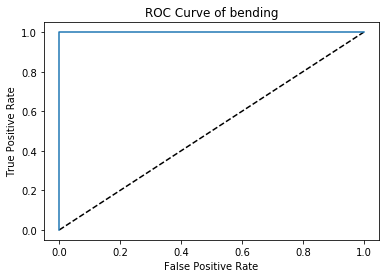

ROC and AUC score is: 1.0


In [283]:
y_score = MNB.predict_proba(breakdown_table2)
prob_bending=y_score[:, 0]
prob_cycling=y_score[:, 1]
prob_lying=y_score[:, 2]
prob_sitting=y_score[:, 3]
prob_standing=y_score[:, 4]
prob_walking=y_score[:, 5]

bending_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="bending" else 0)
fpr, tpr, thresholds = roc_curve(bending_test_y, prob_bending)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of bending')
plt.show()

roc_auc_ = roc_auc_score(bending_test_y, prob_bending)
print("ROC and AUC score is:", roc_auc_)

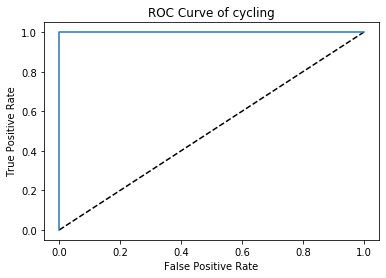

ROC and AUC score is: 1.0


In [284]:
cycling_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="cycling" else 0)
fpr, tpr, thresholds = roc_curve(cycling_test_y, prob_cycling)
#plot of cycling's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of cycling')
plt.show()

roc_auc_ = roc_auc_score(cycling_test_y, prob_cycling)
print("ROC and AUC score is:", roc_auc_)

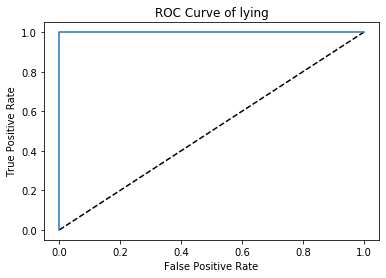

ROC and AUC score is: 1.0


In [285]:
lying_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="lying" else 0)
fpr, tpr, thresholds = roc_curve(lying_test_y, prob_lying)
#plot of lying's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of lying')
plt.show()

roc_auc_ = roc_auc_score(lying_test_y, prob_lying)
print("ROC and AUC score is:", roc_auc_)

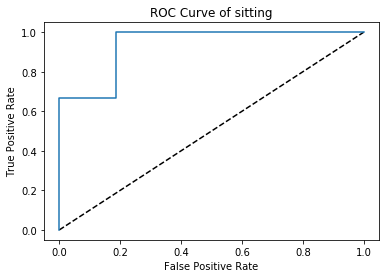

ROC and AUC score is: 0.9375


In [286]:
#ROC curve of sitting
sitting_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="sitting" else 0)
fpr, tpr, thresholds = roc_curve(sitting_test_y, prob_sitting)
#plot of sitting's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of sitting')
plt.show()

roc_auc_ = roc_auc_score(sitting_test_y, prob_sitting)
print("ROC and AUC score is:", roc_auc_)

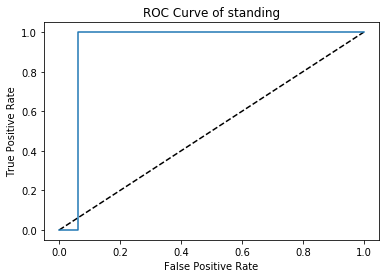

ROC and AUC score is: 0.9375


In [287]:
#ROC curve of standing
standing_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="standing" else 0)
fpr, tpr, thresholds = roc_curve(standing_test_y, prob_standing)
#plot of standing's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of standing')
plt.show()

roc_auc_ = roc_auc_score(standing_test_y, prob_standing)
print("ROC and AUC score is:", roc_auc_)

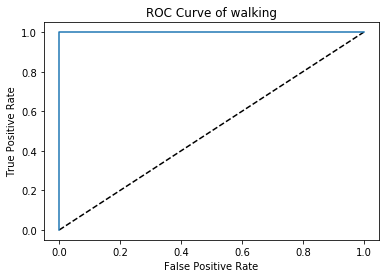

ROC and AUC score is: 1.0


In [288]:
#ROC curve of walking
walking_test_y=breakdown_table_['activity'].apply(lambda x:1 if x=="walking" else 0)
fpr, tpr, thresholds = roc_curve(walking_test_y, prob_walking)
#plot of walking's ROC curve
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve of walking')
plt.show()

roc_auc_ = roc_auc_score(walking_test_y, prob_walking)
print("ROC and AUC score is:", roc_auc_)

## iii. Which method is better for multi-class classification in this problem?

The best test accuracy of L1-penalized Logistic Regression Model is 0.842. 
The best test accuracy of Gaussian Na¨ıve Bayes’ classiﬁer Model is 0.789
The best test accuracy of Multinomial Na¨ıve Bayes’ classiﬁer Model is 0.895. 

In this problem, the best method for multi-class classification is Multinomial Na¨ıve Bayes’ classiﬁer.